In [34]:
import numpy as np
import imageio
import matplotlib.pyplot as plt
import matplotlib
import os
import glob
import torch
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset

In [79]:
def coords_to_normals(coords):
    coords = torch.as_tensor(coords)
    if coords.ndim < 4:
        coords = coords[None]

    dxdu = coords[..., 0, :, 1:] - coords[..., 0, :, :-1]
    dydu = coords[..., 1, :, 1:] - coords[..., 1, :, :-1]
    dzdu = coords[..., 2, :, 1:] - coords[..., 2, :, :-1]
    dxdv = coords[..., 0, 1:, :] - coords[..., 0, :-1, :]
    dydv = coords[..., 1, 1:, :] - coords[..., 1, :-1, :]
    dzdv = coords[..., 2, 1:, :] - coords[..., 2, :-1, :]

    dxdu = torch.nn.functional.pad(dxdu, (0, 1),       mode='replicate')
    dydu = torch.nn.functional.pad(dydu, (0, 1),       mode='replicate')
    dzdu = torch.nn.functional.pad(dzdu, (0, 1),       mode='replicate')

    # pytorch cannot just do `dxdv = torch.nn.functional.pad(dxdv, (0, 0, 0, 1), mode='replicate')`, so
    dxdv = torch.cat([dxdv, dxdv[..., -1:, :]], dim=-2)
    dydv = torch.cat([dydv, dydv[..., -1:, :]], dim=-2)
    dzdv = torch.cat([dzdv, dzdv[..., -1:, :]], dim=-2)

    n_x = dydv * dzdu - dydu * dzdv
    n_y = dzdv * dxdu - dzdu * dxdv
    n_z = dxdv * dydu - dxdu * dydv

    n = torch.stack([n_x, n_y, n_z], dim=-3)
    n = torch.nn.functional.normalize(n, dim=-3)
    return n

def depth_to_absolute_coordinates(depth, depth_type, K, shift):

    depth = torch.as_tensor(depth)
    dtype = depth.dtype
    h, w = depth.shape[-2:]
    K = torch.as_tensor(K, dtype=dtype)

    v, u = torch.meshgrid(torch.arange(h, dtype=dtype) + shift, torch.arange(w, dtype=dtype) + shift)
    if depth.ndim < 3:  # ensure depth has channel dimension
        depth = depth[None]
    ones = torch.ones_like(v)
    points = torch.einsum('lk,kij->lij', K.inverse(), torch.stack([u, v, ones]))
    if depth_type == 'perspective':
        points = torch.nn.functional.normalize(points, dim=-3)
        points = points.to(depth) * depth
    elif depth_type == 'orthogonal':
        points = points / points[2:3]
        points = points.to(depth) * depth
    else:
        raise ValueError(f'Unknown type {depth_type}')
    return points

In [80]:
import albumentations as A
def apply_transformer(transformations,  depth):
    res = A.Compose(transformations, p=1)(image=depth)
    return res

# Enhancement

In [117]:
# vis_scene = ['scene0320_01_100', 'scene0507_00_900', 'scene0406_02_800', 'scene0213_00_1800', 'scene0331_00_1600']
vis_scene = ['scene0320_01_100', 'scene0507_00_900']

SRFBN_sup = '/root/callisto/SRFBN_CVPR19/test_pred_plus'
gu_path = '/root/datasets/un_depth/results/Gu_show5/depth/'
jeon_path = '/root/datasets/un_depth/results/Jeon_show5/depth/'
gu_zssr_path = '/root/callisto/depth_SR/show_GU_ZSSR'
jeon_zssr_path = '/root/callisto/depth_SR/show_Jeon_ZSSR'
gu_srfbn_path = '/root/callisto/depth_SR/show_GU_SRFBN'
jeon_srfbn_path = '/root/callisto/depth_SR/show_Jeon_SRFBN'

nikita_path = '/root/callisto/depth_SR/test_pred_best'
nikita_zssr_path = '/root/callisto/depth_SR/test_pred_best_sr_x2_ZH'
nikita_zssr_enhanced_path = '/root/callisto/depth_SR/test_pred_best_sr_x2_ZH_enh'
nikita_srfbn_path = '/root/callisto/depth_SR/test_pred_best_sr_x2_SRFBN_640_1280'

nikita_naive_path = '/root/callisto/depth_SR/test_pred_naive_hr_3'
nikita_up_path = '/root/callisto/depth_SR/show_up_sr'

MAX = '/root/datasets/un_depth/vis/max'
nik = '/root/callisto/depth_SR/show_best'

# methods = [SRFBN_sup, gu_path, jeon_path, gu_zssr_path, jeon_zssr_path, gu_srfbn_path, jeon_srfbn_path, nikita_path, nikita_zssr_path, nikita_zssr_enhanced_path, nikita_srfbn_path, nikita_naive_path, nikita_up_path]
# methods_name = ['SRFBN supervised', 'Gu + bicub', 'Gu + ZSSH', 'Gu + SRFBN',  'Jeon + bicub', 'Jeon + ZSSH', 'Jeon + SRFBN',  'nikita + bicubic',  'nikita + ZSSR', 'nikita + ZSSR enhanced', 'nikita + SRFBN', 'nikita naive sr', 'nikita up sr ' ]


methods = [gu_path, nik]
methods_name = ['Gu', 'Ours']


rmse  = [[214, 202], [208, 179]]
rmse_h  = [[ 461, 456], [ 298, 286]]
mse = [[ 0.355, 0.206], [ 0.330, 0.190]]
raw_path = '/root/datasets/un_depth/Scannet_ssim/testA/full_size/depth/'
render_sr_path = '/root/datasets/un_depth/Scannet_ssim/testB/full_size/depth/'
img_path = '/root/datasets/un_depth/Scannet_ssim/testA/full_size/img/'
pred_depths = []
img = []

for _dir in methods:
    pp = []
    for scene in vis_scene:
        
        pred_depth = imageio.imread(os.path.join(_dir, scene+'.png'))
        im = imageio.imread(os.path.join(img_path, scene+'.jpg'))
        print(_dir)
        print(pred_depth.shape)
#         if pred_depth.shape[-1]<1280:
#             transform_list = []
#             transform_list.append(A.Resize(height=960, width=1280, interpolation=3, p=1))
#             transformed = apply_transformer(transform_list, pred_depth)
#             pred_depth = transformed['image']
        pp.append(pred_depth)
        img.append(im)
    pred_depths.append(pp)
                
img = img[:5]


raw = [imageio.imread(os.path.join(raw_path, scene+'.png')) for scene in vis_scene]
render = [imageio.imread(os.path.join(render_sr_path, scene+'.png')) for scene in vis_scene]

K = [np.loadtxt(os.path.join('/root/datasets/un_depth/Scannet/', scene[:12], 'intrinsic', 'intrinsic_depth.txt'))[:3,:3] for scene in vis_scene]
raw_normals = [coords_to_normals(depth_to_absolute_coordinates(depth.astype(np.float64), 'orthogonal', K_, 0.5)) for depth, K_ in zip(raw, K)]
scale_K = np.array([[2., 1., 2.],[1., 2., 2.],[1., 1., 1.]])
render_normals = [coords_to_normals(depth_to_absolute_coordinates(depth.astype(np.float64), 'orthogonal',K_ *scale_K, 0.5)) for depth, K_ in zip(render, K)]

pred_normals = [[coords_to_normals(depth_to_absolute_coordinates(pred_depths[i][j].astype(np.float64), 'orthogonal',K[j]*scale_K , 0.5)) for j in range(len(vis_scene))] for i in range(len(methods))]

/root/datasets/un_depth/results/Gu_show5/depth/
(480, 640)
/root/datasets/un_depth/results/Gu_show5/depth/
(480, 640)
/root/callisto/depth_SR/show_best
(480, 640)
/root/callisto/depth_SR/show_best
(480, 640)


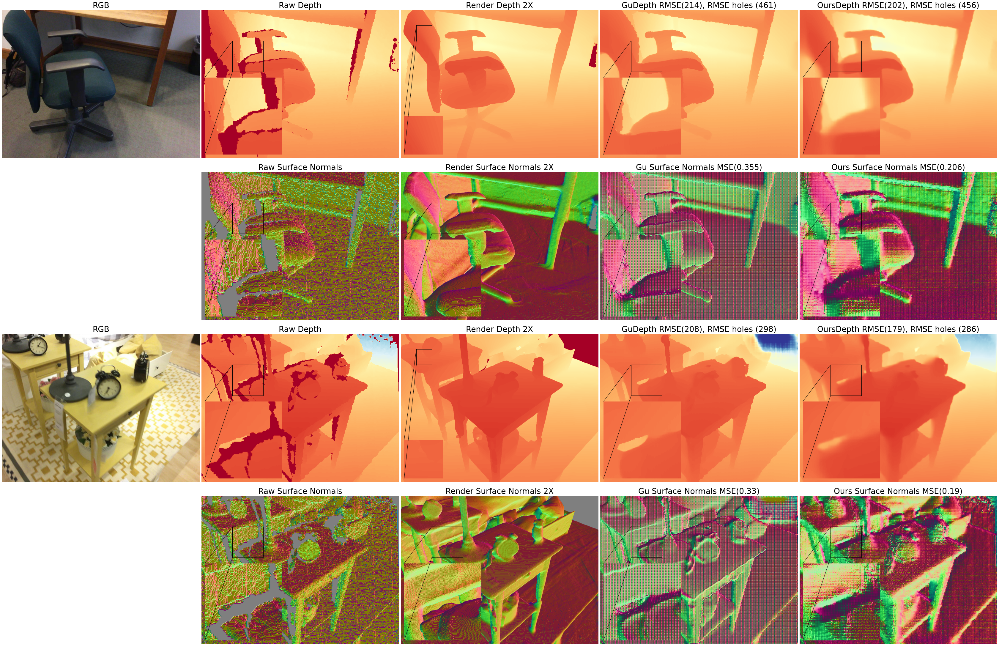

In [121]:
matplotlib.rcParams.update({'font.size': 22})
x1, y1, x2, y2 = [100, 100, 200, 200]
x1_s, y1_s, x2_s, y2_s = [100, 100, 200, 200]
x1_r, y1_r, x2_r, y2_r = [200, 200, 400, 400]
n_row = 2 * len(vis_scene)
n_col = len(methods) + 3
max_val = 5100
fig, axes = plt.subplots(n_row, n_col, figsize=(12 * n_col, 10 * n_row))
fig.subplots_adjust(hspace=0.01, wspace=0.01)
for i,ax in enumerate(axes.flatten()):
    ax.axis('off')
for i in range(len(vis_scene)):
    axes[2*i, 0].set_title('RGB')
    axes[2*i, 1].set_title('Raw Depth')
    axes[2*i, 2].set_title('Render Depth 2X')
    for j, name in enumerate(methods_name):
        axes[2*i, 3 + j].set_title(name + 'Depth')
        axes[2*i, 3 + j].set_title(name + 'Depth' + f" RMSE({rmse[i][j]}), RMSE holes ({rmse_h[i][j]})")
    
    axes[2*i + 1, 0].set_title('')
    axes[2*i + 1, 1].set_title('Raw Surface Normals')
    axes[2*i + 1, 2].set_title('Render Surface Normals 2X')
    for j, name in enumerate(methods_name):
        axes[2*i + 1, 3 + j].set_title(name + ' Surface Normals'+ f" MSE({mse[i][j]})")
    
    axes[2*i,0].imshow(img[i])
    axes[2*i,1].imshow(raw[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
    axins = zoomed_inset_axes(axes[2*i, 1], 2.5, loc=3) # zoom-factor: 2.5, location: upper-left
    axins.imshow(raw[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
    axins.set_xlim(x1, x2) # apply the x-limits
    axins.set_ylim(y2, y1)
    axins.axis('off')
    _patch, pp1, pp2 = mark_inset(axes[2*i,1], axins, loc1=1, loc2=3, fc="none", ec="black")
    pp1.loc1, pp1.loc2 = 2, 3  
    pp2.loc1, pp2.loc2 = 3, 2  
    
    axes[2*i,2].imshow(render[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
    axins = zoomed_inset_axes(axes[2*i, 2], 2.5, loc=3) # zoom-factor: 2.5, location: upper-left
    axins.imshow(render[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
    axins.set_xlim(x1_s, x2_s) # apply the x-limits
    axins.set_ylim(y2_s, y1_s)
    axins.axis('off')
    _patch, pp1, pp2 = mark_inset(axes[2*i,2], axins, loc1=1, loc2=3, fc="none", ec="black")
    pp1.loc1, pp1.loc2 = 2, 3  
    pp2.loc1, pp2.loc2 = 3, 2  
    
    for j, name in enumerate(methods):
        axes[2*i, 3 + j].imshow(pred_depths[j][i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
        axins = zoomed_inset_axes(axes[2*i, 3 + j], 2.5, loc=3) # zoom-factor: 2.5, location: upper-left
        axins.imshow(pred_depths[j][i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
        axins.set_xlim(x1_s, x2_s) # apply the x-limits
        axins.set_ylim(y2_s, y1_s)
        axins.axis('off')
        _patch, pp1, pp2 = mark_inset(axes[2*i, 3 + j], axins, loc1=1, loc2=3, fc="none", ec="black")
        pp1.loc1, pp1.loc2 = 2, 3  
        pp2.loc1, pp2.loc2 = 3, 2  

    axes[2*i + 1,1].imshow((raw_normals[i][0].permute(1,2,0).numpy() + 1.) / 2.)
    axins = zoomed_inset_axes(axes[2*i + 1,1], 2.5, loc=3) # zoom-factor: 2.5, location: upper-left
    axins.imshow((raw_normals[i][0].permute(1,2,0).numpy() + 1.) / 2.)
    axins.set_xlim(x1, x2) # apply the x-limits
    axins.set_ylim(y2, y1)
    axins.axis('off')
    _patch, pp1, pp2 = mark_inset(axes[2*i + 1,1], axins, loc1=1, loc2=3, fc="none", ec="black")
    pp1.loc1, pp1.loc2 = 2, 3  
    pp2.loc1, pp2.loc2 = 3, 2  
    
    axes[2*i + 1,2].imshow((render_normals[i][0].permute(1,2,0).numpy() + 1.) / 2.)
    axins = zoomed_inset_axes(axes[2*i + 1, 2], 2.5, loc=3) # zoom-factor: 2.5, location: upper-left
    axins.imshow((render_normals[i][0].permute(1,2,0).numpy() + 1.) / 2.)
    axins.set_xlim(x1_r, x2_r) # apply the x-limits
    axins.set_ylim(y2_r, y1_r)
    axins.axis('off')
    _patch, pp1, pp2 = mark_inset(axes[2*i + 1, 2], axins, loc1=1, loc2=3, fc="none", ec="black")
    pp1.loc1, pp1.loc2 = 2, 3  
    pp2.loc1, pp2.loc2 = 3, 2  
    
    for j, name in enumerate(methods):
        axes[2*i + 1, 3 + j].imshow((pred_normals[j][i][0].permute(1,2,0).numpy() + 1.) / 2.)
        axins = zoomed_inset_axes(axes[2*i + 1, 3 + j], 2.5, loc=3) # zoom-factor: 2.5, location: upper-left
        axins.imshow((pred_normals[j][i][0].permute(1,2,0).numpy() + 1.) / 2.)
        axins.set_xlim(x1_s, x2_s) # apply the x-limits
        axins.set_ylim(y2_s, y1_s)
        axins.axis('off')
        _patch, pp1, pp2 = mark_inset(axes[2*i + 1, 3 + j], axins, loc1=1, loc2=3, fc="none", ec="black")
        pp1.loc1, pp1.loc2 = 2, 3  
        pp2.loc1, pp2.loc2 = 3, 2 
plt.savefig('./enhancement.png')

In [119]:
matplotlib.rcParams.update({'font.size': 22})
n_row = 2 * len(vis_scene)
n_col = len(methods) + 3
max_val = 5100
fig, axes = plt.subplots(n_row, n_col, figsize=(12 * n_col, 10 * n_row))
fig.subplots_adjust(hspace=0.01, wspace=0.01)
for i,ax in enumerate(axes.flatten()):
    ax.axis('off')
for i in range(len(vis_scene)):
    axes[2*i, 0].set_title('RGB')
    axes[2*i, 1].set_title('Raw Depth')
    axes[2*i, 2].set_title('Render Depth 2X')
    for j, name in enumerate(methods_name):
        axes[2*i, 3 + j].set_title(name + ' Depth')
    
    axes[2*i + 1, 0].set_title('')
    axes[2*i + 1, 1].set_title('Raw Surface Normals')
    axes[2*i + 1, 2].set_title('Render Surface Normals 2X')
    for j, name in enumerate(methods_name):
        axes[2*i + 1, 3 + j].set_title(name + ' Surface Normals')
    
    axes[2*i,0].imshow(img[i])
    axes[2*i,1].imshow(raw[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
    axes[2*i,2].imshow(render[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
    for j, name in enumerate(methods):
        axes[2*i, 3 + j].imshow(pred_depths[j][i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)

    axes[2*i + 1,1].imshow((raw_normals[i][0].permute(1,2,0).numpy() + 1.) / 2.)
    axes[2*i + 1,2].imshow((render_normals[i][0].permute(1,2,0).numpy() + 1.) / 2.)
    for j, name in enumerate(methods):
        axes[2*i + 1, 3 + j].imshow((pred_normals[j][i][0].permute(1,2,0).numpy() + 1.) / 2.)
plt.savefig('./enhancement.png')

Error in callback <function flush_figures at 0x7f5ad1ebaee0> (for post_execute):


KeyboardInterrupt: 

In [95]:
matplotlib.rcParams.update({'font.size': 22})
x1, y1, x2, y2 = [100, 100, 250, 250]
x1_s, y1_s, x2_s, y2_s = [200, 200, 500, 500]

n_row = 2 * len(vis_scene)
n_col = len(methods) + 3
max_val = 5100
fig, axes = plt.subplots(n_row, n_col, figsize=(12 * n_col, 10 * n_row))
fig.subplots_adjust(hspace=0.01, wspace=0.01)
for i,ax in enumerate(axes.flatten()):
    ax.axis('off')
for i in range(len(vis_scene)):
    axes[2*i, 0].set_title('RGB')
    axes[2*i, 1].set_title('Raw Depth')
    axes[2*i, 2].set_title('Render Depth 2X')
    for j, name in enumerate(methods_name):
        axes[2*i, 3 + j].set_title(name + ' Depth')
    
    axes[2*i + 1, 0].set_title('')
    axes[2*i + 1, 1].set_title('Raw Surface Normals')
    axes[2*i + 1, 2].set_title('Render Surface Normals 2X')
    for j, name in enumerate(methods_name):
        axes[2*i + 1, 3 + j].set_title(name + ' Surface Normals')
    
    axes[2*i,0].imshow(img[i])
    axes[2*i,1].imshow(raw[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
    axins = zoomed_inset_axes(axes[2*i, 1], 2.5, loc=1) # zoom-factor: 2.5, location: upper-left
    axins.imshow(raw[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
    axins.set_xlim(x1, x2) # apply the x-limits
    axins.set_ylim(y2, y1)
    axins.axis('off')
    _patch, pp1, pp2 = mark_inset(axes[2*i,1], axins, loc1=1, loc2=3, fc="none", ec="black")
    pp1.loc1, pp1.loc2 = 2, 3  
    pp2.loc1, pp2.loc2 = 3, 2  
    
    axes[2*i,2].imshow(render[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
    axins = zoomed_inset_axes(axes[2*i, 2], 2.5, loc=1) # zoom-factor: 2.5, location: upper-left
    axins.imshow(render[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
    axins.set_xlim(x1_s, x2_s) # apply the x-limits
    axins.set_ylim(y2_s, y1_s)
    axins.axis('off')
    _patch, pp1, pp2 = mark_inset(axes[2*i,2], axins, loc1=1, loc2=3, fc="none", ec="black")
    pp1.loc1, pp1.loc2 = 2, 3  
    pp2.loc1, pp2.loc2 = 3, 2  
    
    for j, name in enumerate(methods):
        axes[2*i, 3 + j].imshow(pred_depths[j][i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
        axins = zoomed_inset_axes(axes[2*i, 3 + j], 2.5, loc=3) # zoom-factor: 2.5, location: upper-left
        axins.imshow(pred_depths[j][i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=max_val)
        axins.set_xlim(x1_s, x2_s) # apply the x-limits
        axins.set_ylim(y2_s, y1_s)
        axins.axis('off')
        _patch, pp1, pp2 = mark_inset(axes[2*i, 3 + j], axins, loc1=1, loc2=3, fc="none", ec="black")
        pp1.loc1, pp1.loc2 = 2, 3  
        pp2.loc1, pp2.loc2 = 3, 2  

    axes[2*i + 1,1].imshow((raw_normals[i][0].permute(1,2,0).numpy() + 1.) / 2.)
    axins = zoomed_inset_axes(axes[2*i + 1,1], 2.5, loc=3) # zoom-factor: 2.5, location: upper-left
    axins.imshow((raw_normals[i][0].permute(1,2,0).numpy() + 1.) / 2.)
    axins.set_xlim(x1, x2) # apply the x-limits
    axins.set_ylim(y2, y1)
    axins.axis('off')
    _patch, pp1, pp2 = mark_inset(axes[2*i + 1,1], axins, loc1=1, loc2=3, fc="none", ec="black")
    pp1.loc1, pp1.loc2 = 2, 3  
    pp2.loc1, pp2.loc2 = 3, 2  
    
    axes[2*i + 1,2].imshow((render_normals[i][0].permute(1,2,0).numpy() + 1.) / 2.)
    axins = zoomed_inset_axes(axes[2*i + 1, 2], 2.5, loc=3) # zoom-factor: 2.5, location: upper-left
    axins.imshow((render_normals[i][0].permute(1,2,0).numpy() + 1.) / 2.)
    axins.set_xlim(x1_r, x2_r) # apply the x-limits
    axins.set_ylim(y2_r, y1_r)
    axins.axis('off')
    _patch, pp1, pp2 = mark_inset(axes[2*i + 1, 2], axins, loc1=1, loc2=3, fc="none", ec="black")
    pp1.loc1, pp1.loc2 = 2, 3  
    pp2.loc1, pp2.loc2 = 3, 2  
    
    for j, name in enumerate(methods):
        axes[2*i + 1, 3 + j].imshow((pred_normals[j][i][0].permute(1,2,0).numpy() + 1.) / 2.)
        axins = zoomed_inset_axes(axes[2*i + 1, 3 + j], 2.5, loc=3) # zoom-factor: 2.5, location: upper-left
        axins.imshow((pred_normals[j][i][0].permute(1,2,0).numpy() + 1.) / 2.)
        axins.set_xlim(x1_s, x2_s) # apply the x-limits
        axins.set_ylim(y2_s, y1_s)
        axins.axis('off')
        _patch, pp1, pp2 = mark_inset(axes[2*i + 1, 3 + j], axins, loc1=3, loc2=1, fc="none", ec="black")
        pp1.loc1, pp1.loc2 = 2, 3  
        pp2.loc1, pp2.loc2 = 3, 2 
plt.savefig('./enhancement_and_sr.png')

AssertionError: 

AssertionError: 

<Figure size 4320x7200 with 90 Axes>